In [1]:
from sklearn.feature_selection import RFECV, RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GroupKFold


from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D

from sklearn import manifold
from sklearn.metrics import euclidean_distances

import seaborn as sns
import pandas as pd
import numpy as np
import math
import os

# load data
import load_data
# modals
import file_structure

def label_conversion(numpy_labels):
	labels = numpy_labels.tolist()
	labels_str = list()

	for i in range(len(labels)):

		if numpy_labels[i] == 0:
			labels_str.append('non-codel')
		else:
			labels_str.append('codel')

	return labels_str


def find_correlation(df, thresh=0.8):
	"""
	Given a numeric pd.DataFrame, this will find highly correlated features,
	and return a list of features to remove as a boolean
	params:
	- df : pd.DataFrame
	- thresh : correlation threshold, will remove one of pairs of features with
			   a correlation greater than this value
	"""
	corr = df.corr()

	features_to_remove = ~(corr.mask(np.eye(len(corr), dtype=bool)).abs() > thresh).any()

	return features_to_remove

In [2]:

modal_list = ['FLAIR','T1', 'T1post','T2']
study_list = ['texture','TDA','CNN']
study_list = ['cmb']
study_list = ['texture']
#study = 'CNN' # <== CHANGE HERE




texture fold: 0
texture fold: 1
texture fold: 2
texture fold: 3
texture fold: 4
texture fold: 5
texture fold: 6
texture fold: 7
texture fold: 8
texture fold: 9


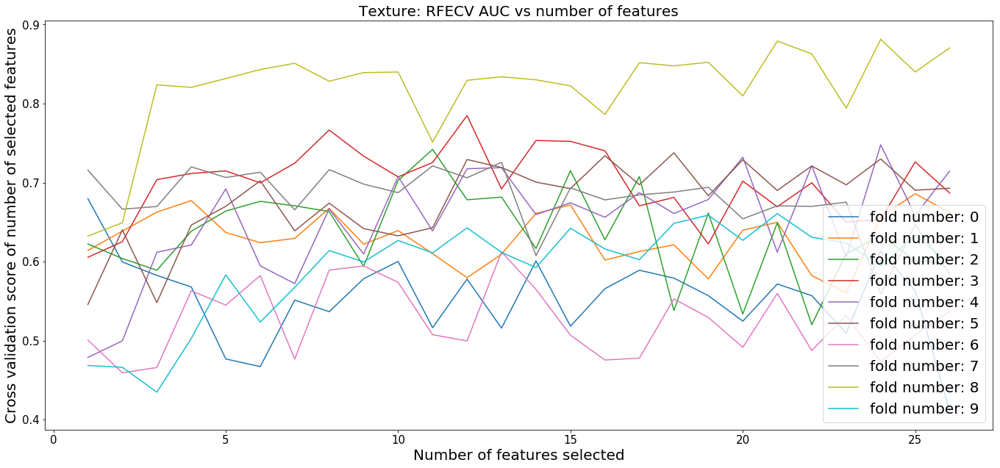

texture fold: 0
texture fold: 1
texture fold: 2
texture fold: 3
texture fold: 4
texture fold: 5
texture fold: 6
texture fold: 7
texture fold: 8
texture fold: 9


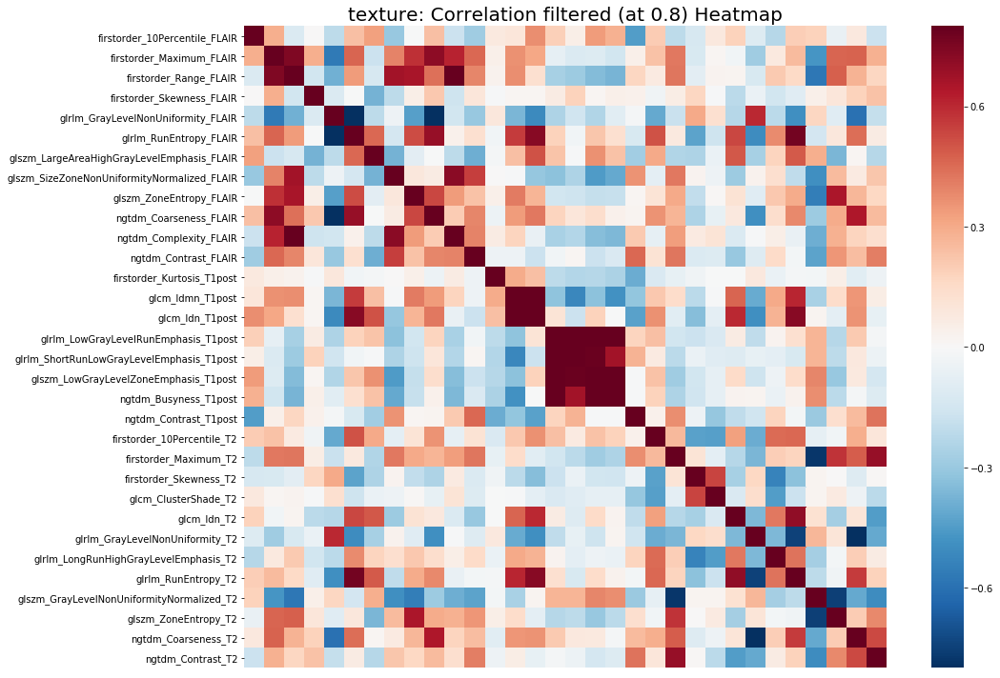

0.6745447042916306
(array([11], dtype=int64),)
TDA fold: 0
TDA fold: 1
TDA fold: 2
TDA fold: 3
TDA fold: 4
TDA fold: 5
TDA fold: 6
TDA fold: 7
TDA fold: 8
TDA fold: 9


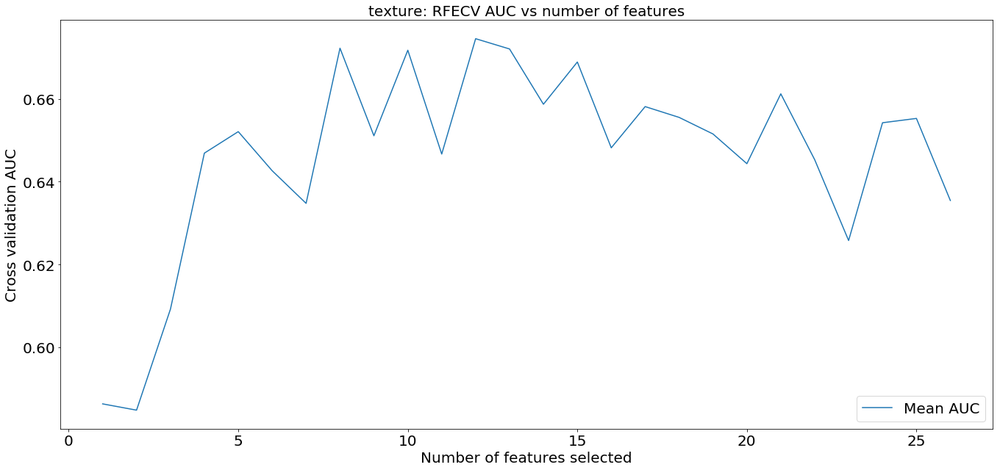

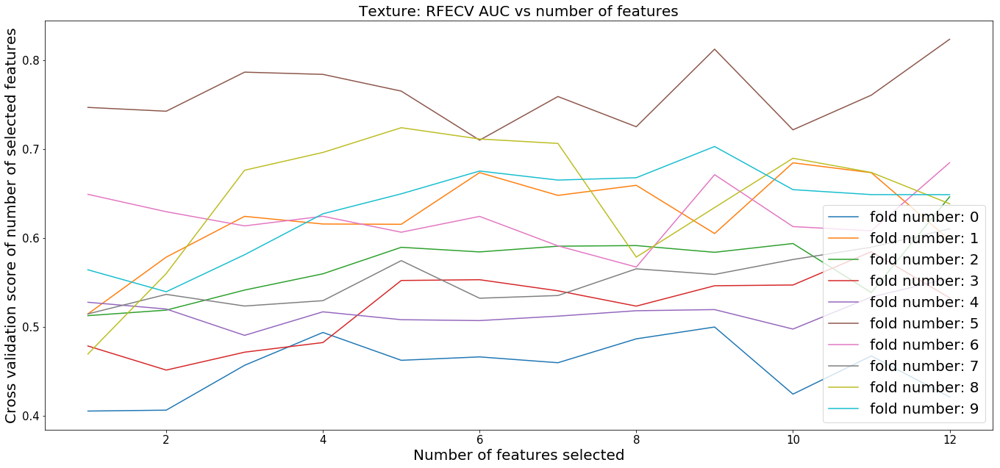

TDA fold: 0
TDA fold: 1
TDA fold: 2
TDA fold: 3
TDA fold: 4
TDA fold: 5
TDA fold: 6
TDA fold: 7
TDA fold: 8
TDA fold: 9


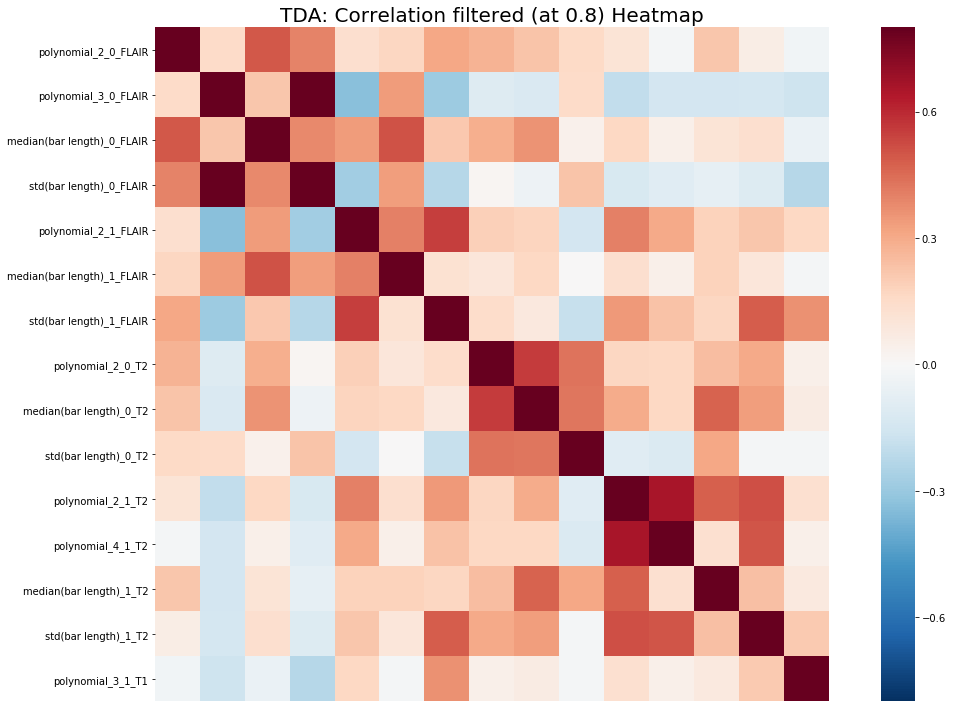

0.6156773654156262
(array([11], dtype=int64),)
CNN fold: 0
CNN fold: 1
CNN fold: 2
CNN fold: 3
CNN fold: 4
CNN fold: 5
CNN fold: 6
CNN fold: 7
CNN fold: 8
CNN fold: 9


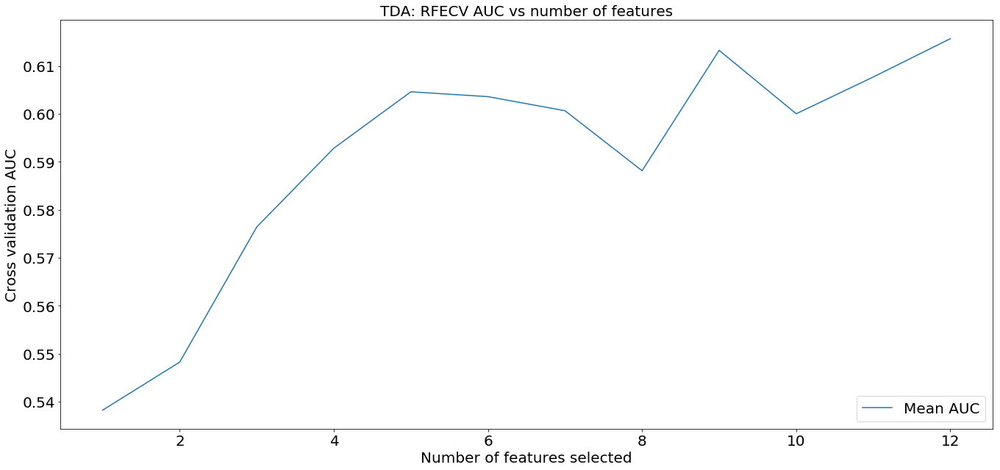

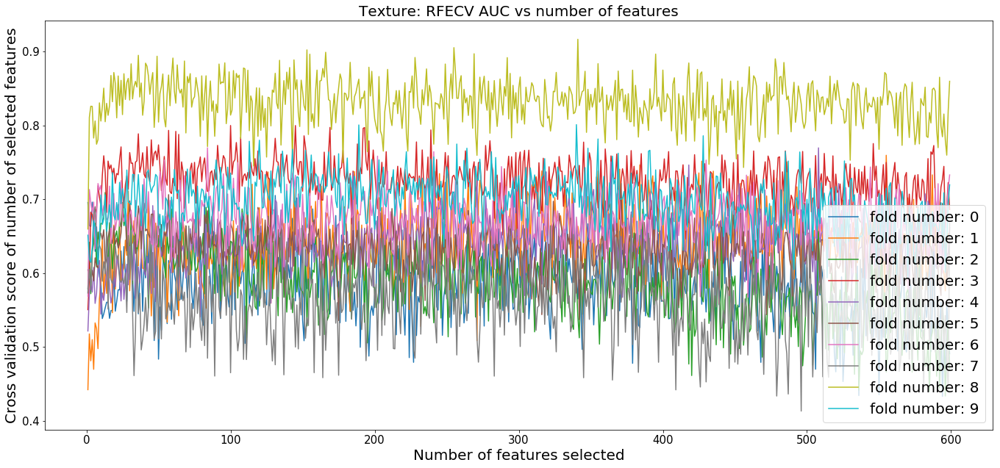

CNN fold: 0
CNN fold: 1
CNN fold: 2
CNN fold: 3
CNN fold: 4
CNN fold: 5
CNN fold: 6
CNN fold: 7
CNN fold: 8
CNN fold: 9


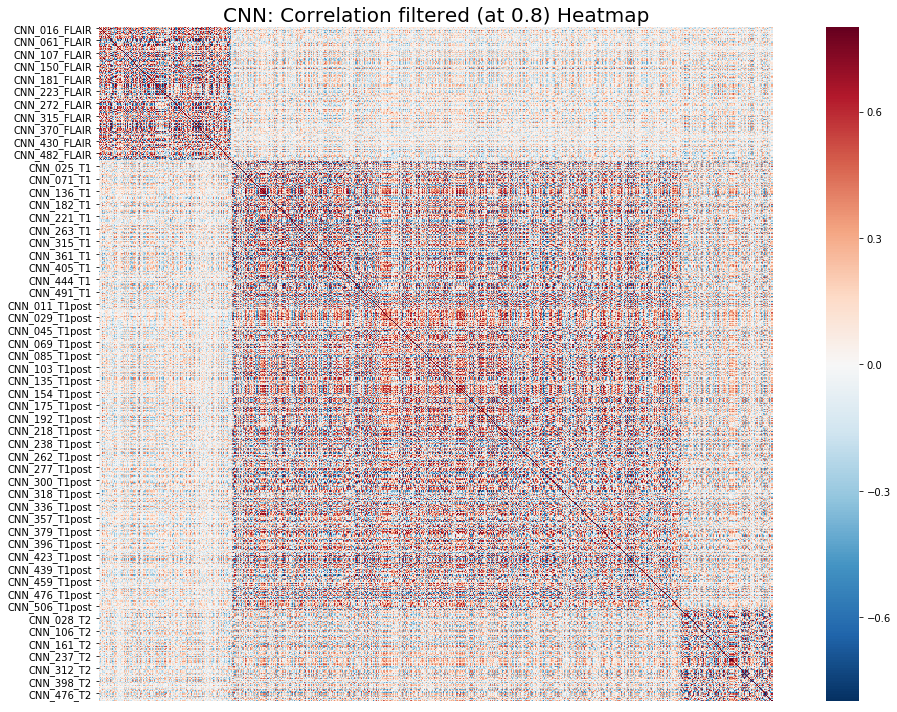

0.6982233188124515
(array([188], dtype=int64),)
cmb fold: 0
cmb fold: 1
cmb fold: 2
cmb fold: 3
cmb fold: 4
cmb fold: 5
cmb fold: 6
cmb fold: 7
cmb fold: 8
cmb fold: 9


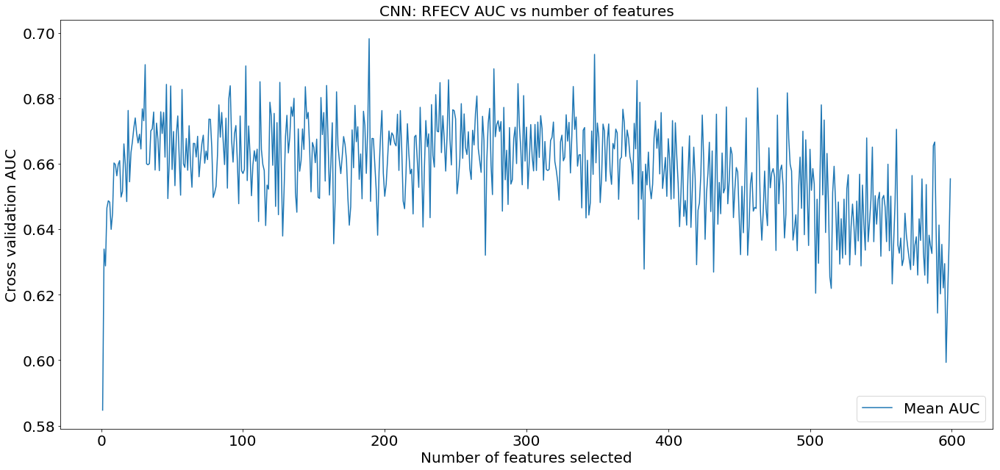

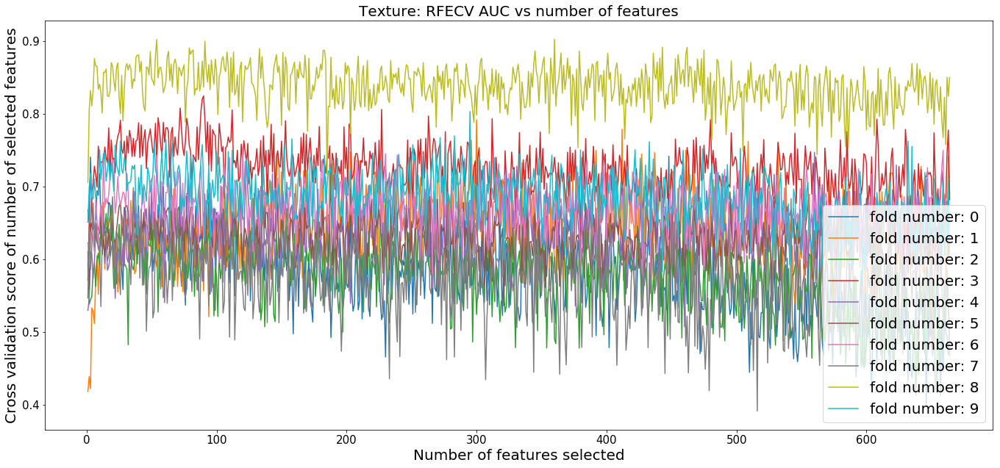

cmb fold: 0
cmb fold: 1
cmb fold: 2
cmb fold: 3
cmb fold: 4
cmb fold: 5
cmb fold: 6
cmb fold: 7
cmb fold: 8
cmb fold: 9


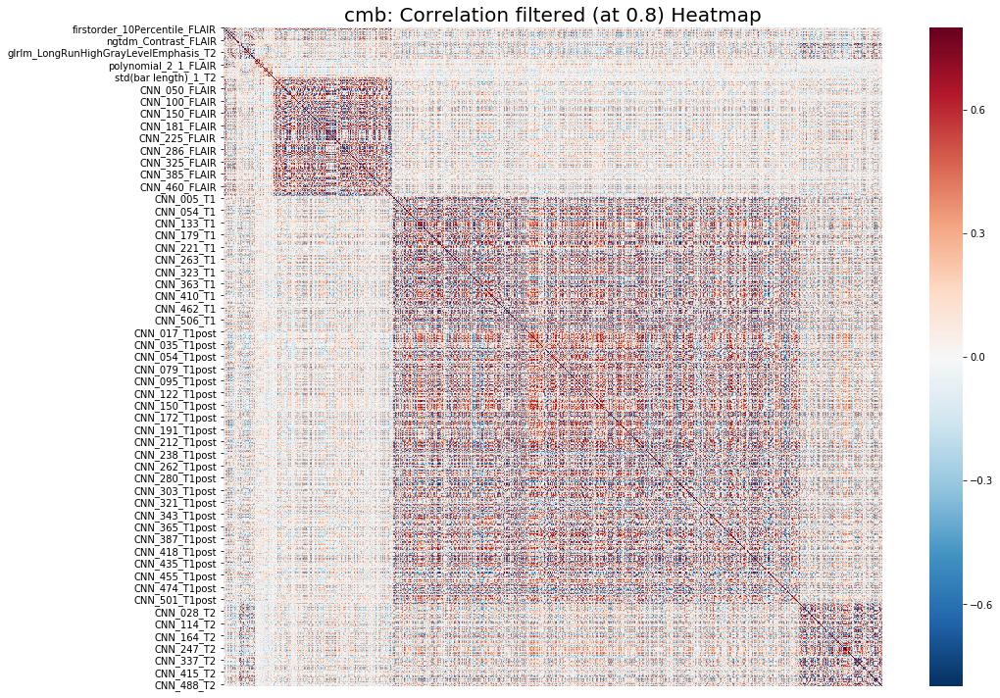

0.6986257676100285
(array([18], dtype=int64),)
texture fold: 0
texture fold: 1
texture fold: 2
texture fold: 3
texture fold: 4
texture fold: 5
texture fold: 6
texture fold: 7
texture fold: 8
texture fold: 9


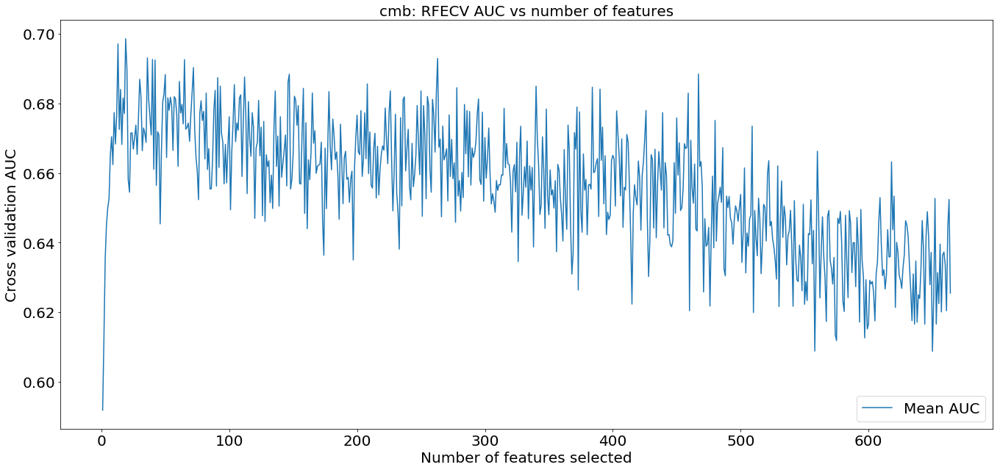

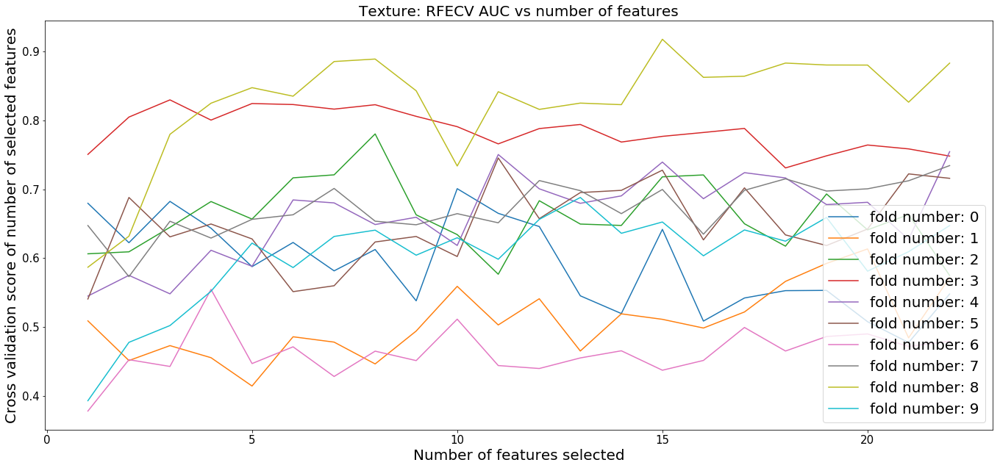

texture fold: 0
texture fold: 1
texture fold: 2
texture fold: 3
texture fold: 4
texture fold: 5
texture fold: 6
texture fold: 7
texture fold: 8
texture fold: 9


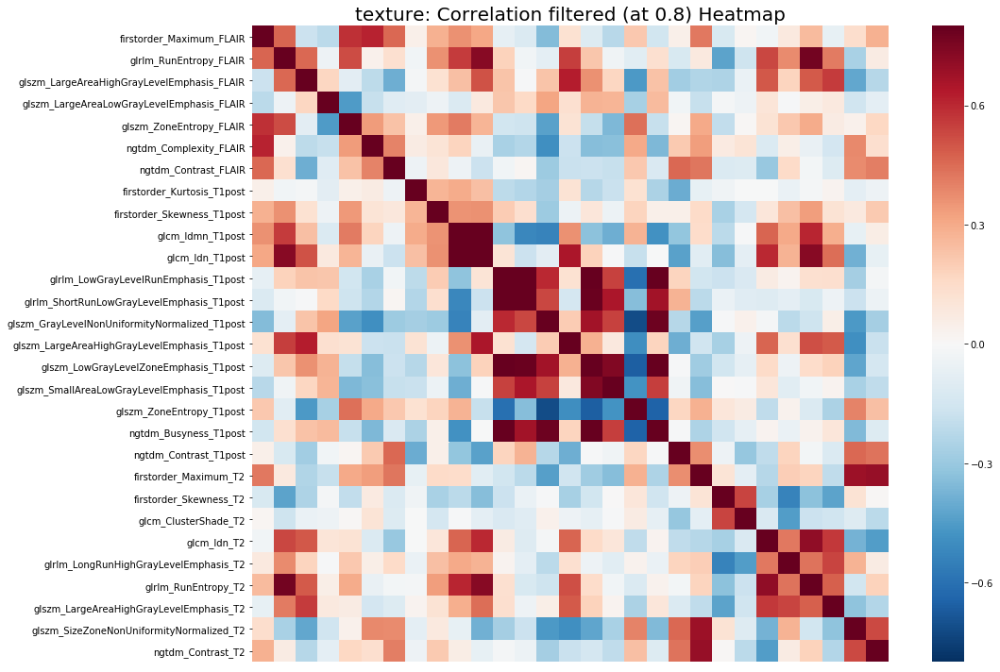

0.6822793427435998
(array([14], dtype=int64),)
TDA fold: 0
TDA fold: 1
TDA fold: 2
TDA fold: 3
TDA fold: 4
TDA fold: 5
TDA fold: 6
TDA fold: 7
TDA fold: 8
TDA fold: 9


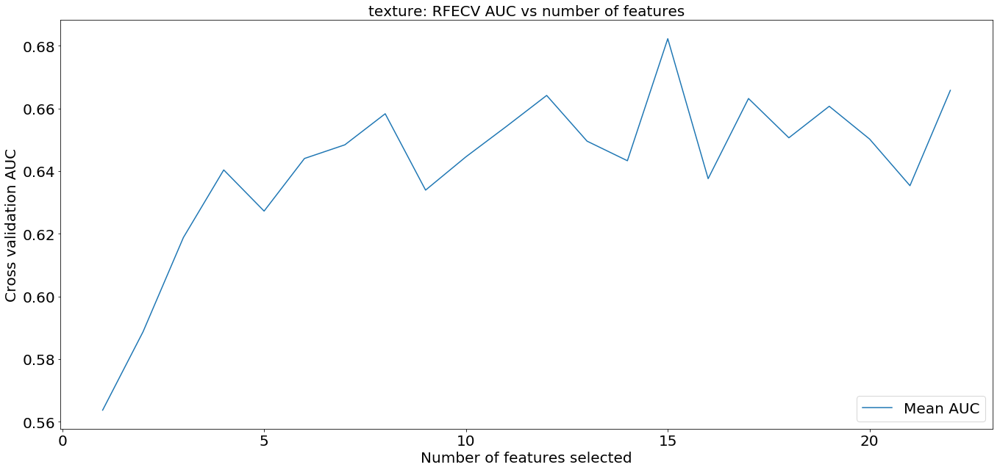

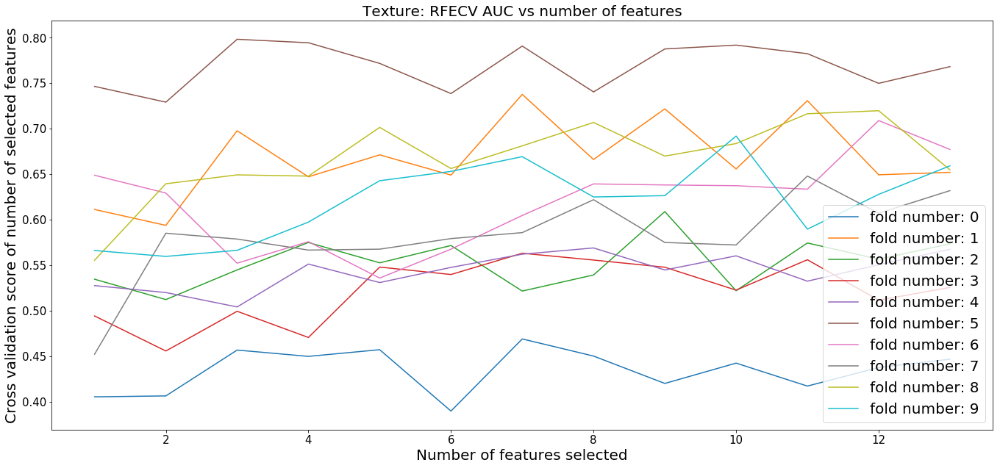

TDA fold: 0
TDA fold: 1
TDA fold: 2
TDA fold: 3
TDA fold: 4
TDA fold: 5
TDA fold: 6
TDA fold: 7
TDA fold: 8
TDA fold: 9


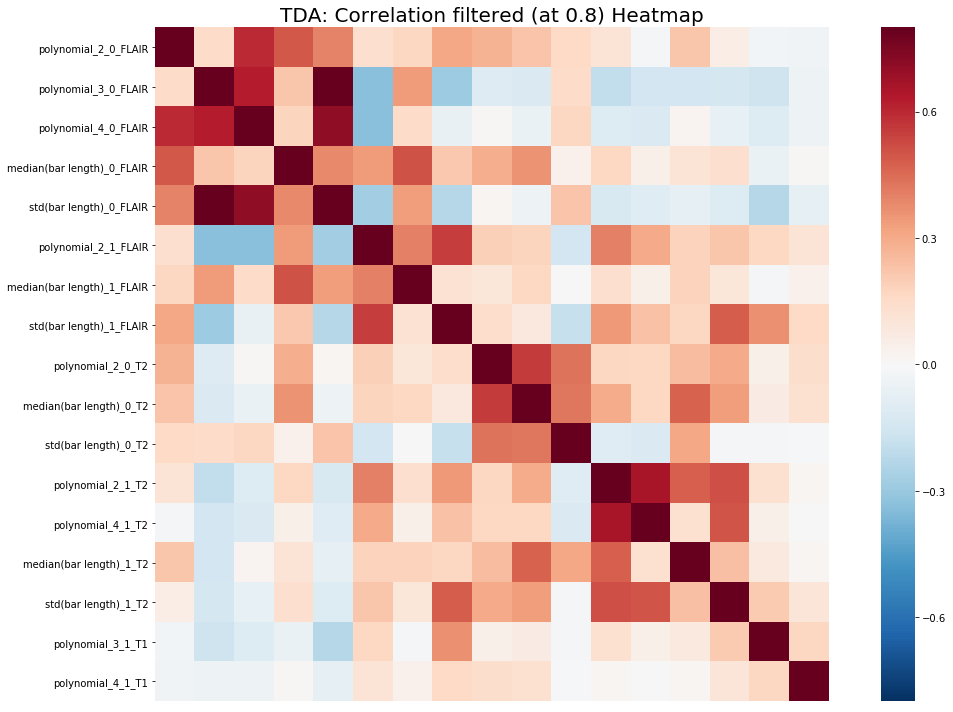

0.6185821548925905
(array([6], dtype=int64),)
CNN fold: 0
CNN fold: 1
CNN fold: 2
CNN fold: 3
CNN fold: 4
CNN fold: 5
CNN fold: 6
CNN fold: 7
CNN fold: 8
CNN fold: 9


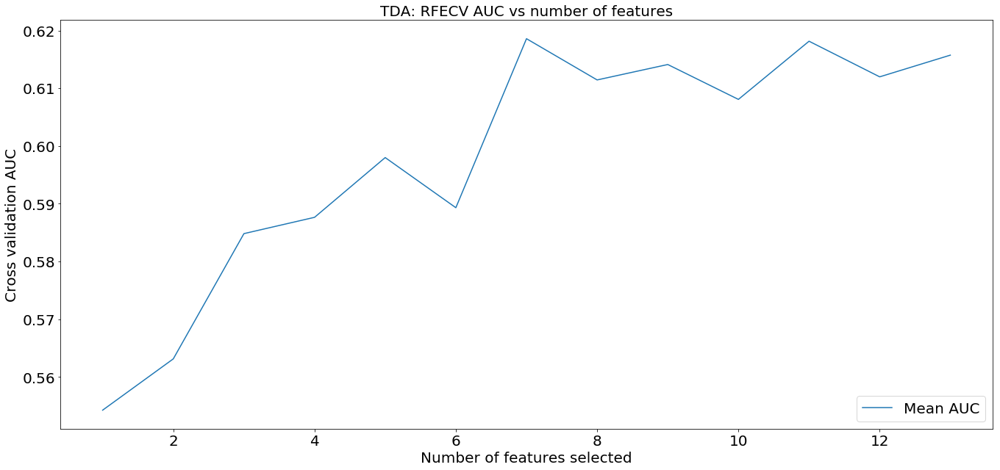

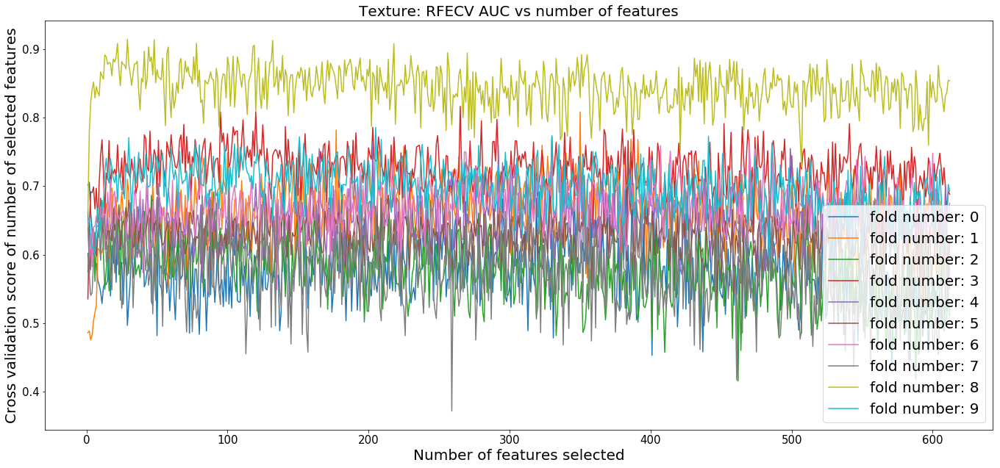

CNN fold: 0
CNN fold: 1
CNN fold: 2
CNN fold: 3
CNN fold: 4
CNN fold: 5
CNN fold: 6
CNN fold: 7
CNN fold: 8
CNN fold: 9


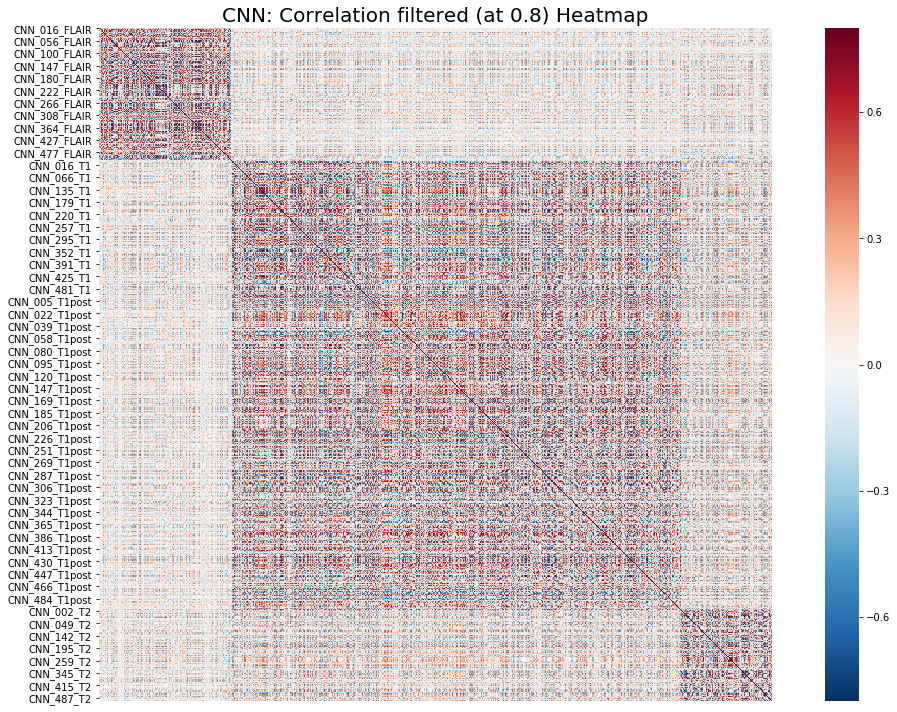

0.7006078262144477
(array([217], dtype=int64),)
cmb fold: 0
cmb fold: 1
cmb fold: 2
cmb fold: 3
cmb fold: 4
cmb fold: 5
cmb fold: 6
cmb fold: 7
cmb fold: 8
cmb fold: 9


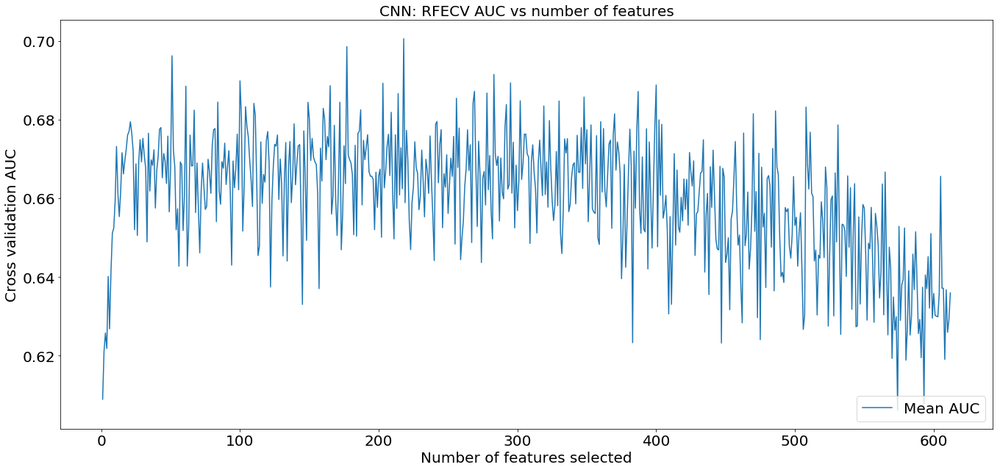

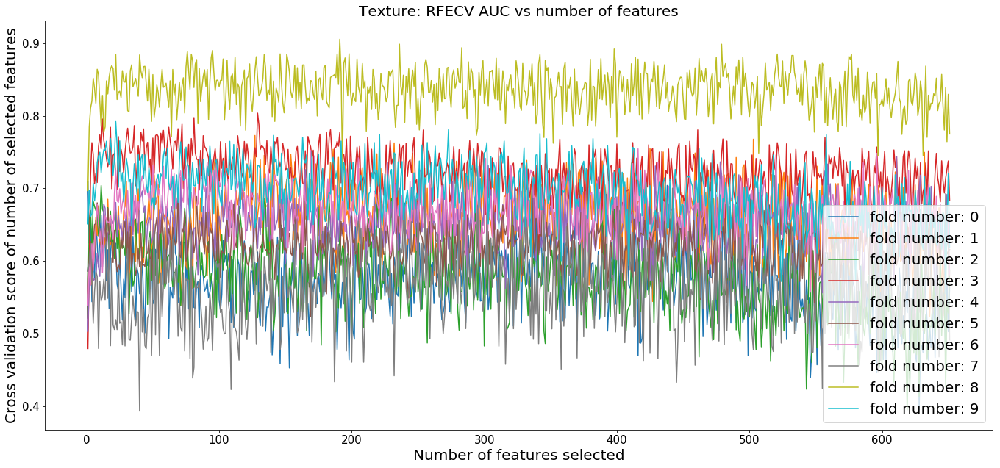

cmb fold: 0
cmb fold: 1
cmb fold: 2
cmb fold: 3
cmb fold: 4
cmb fold: 5
cmb fold: 6
cmb fold: 7
cmb fold: 8
cmb fold: 9


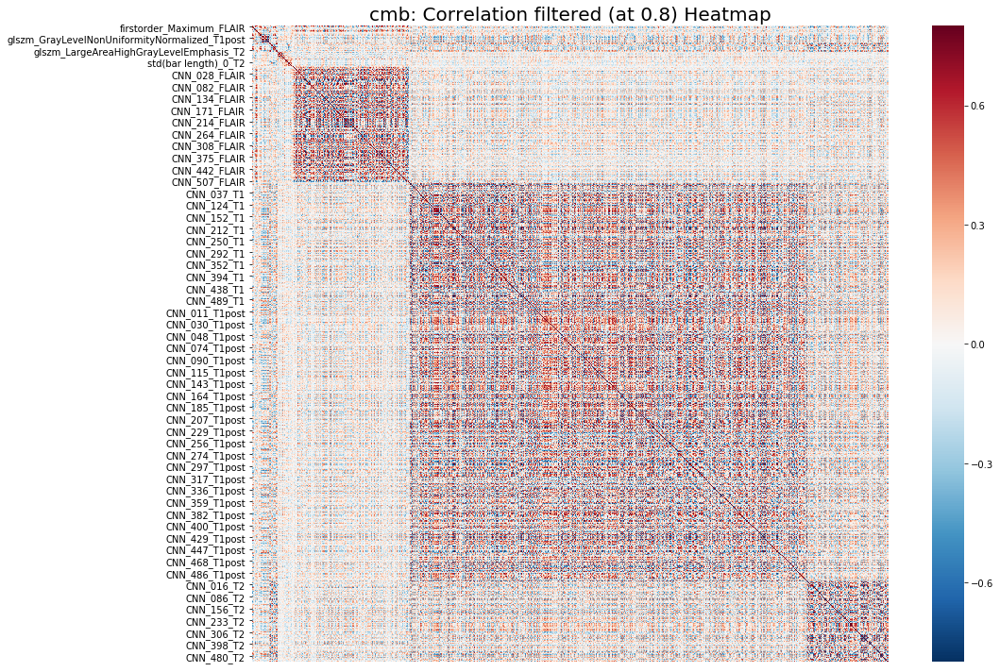

0.6957689963687389
(array([133], dtype=int64),)


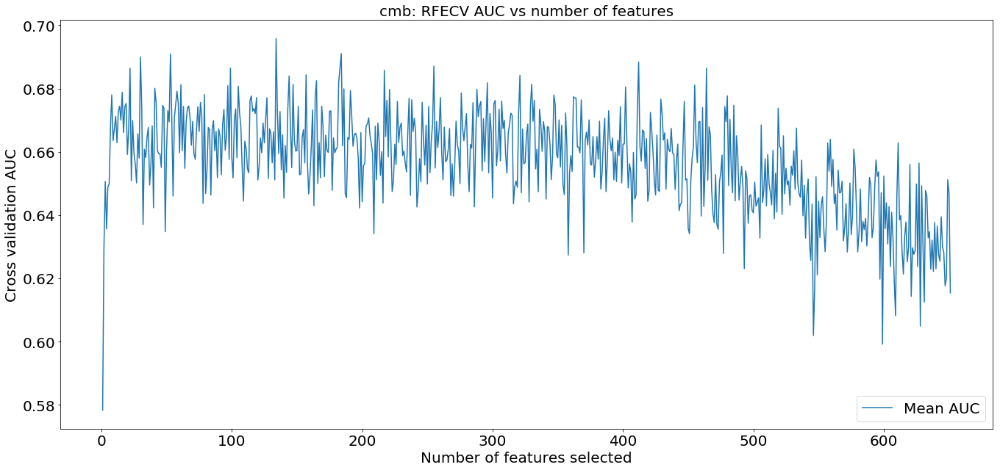

In [3]:
# study_list = ['texture','TDA']   
# study_list = ['cmb']   
study_list = ['texture','TDA','CNN','cmb']
ICC_filt = 3
for ICC_filt in (4,1):
    if ICC_filt == 1:
        suffix = '_icc2'
    elif ICC_filt >= 3:
        suffix = '_icc%i' % ICC_filt
    else: 
        suffix = '' 
    random_state_list = [2,4,6,8,10,12,14,16,18,20] 

    for study in study_list:
        (origdir,basedir,imagedir,normdir,splitdir,out_dir,model_dir) = file_structure.file_dirs(study)
        for flag in ['RFECV','RFE']:
            # initialize the empty data structures
            if flag == 'RFE':
                corr_rfe_dict = {}
                for ii in range(10):
                    corr_rfe_dict = {}
            elif flag == 'RFECV':
                rfecv_dict ={}

            for fold in range(10):
                random_state = random_state_list[fold]

                print('%s fold: %d' % (study,fold))
                # load data
                (train_samples, _ , train_1p19q, train_age, train_KPS,
                 train_gender, train_id, train_fnames) = load_data.load_data('train', fold, study,ICC_filt)
                (val_samples, _ ,val_1p19q, val_age, val_KPS,
                 val_gender, val_id, val_fnames)= load_data.load_data('val',fold, study,ICC_filt)
                # conver 1,0 into string: 'codel' and 'non-codel'
                train_1p19q_str = label_conversion(train_1p19q)
                val_1p19q_str = label_conversion(val_1p19q)
                # combine train and val in case needed

                # create the pandas dataframes
                data_train = pd.DataFrame(data=train_samples, columns=train_fnames, index=train_1p19q_str)
                data_val = pd.DataFrame(data=val_samples, columns=val_fnames, index=val_1p19q_str)

                # combine train and val in case needed
                data_train_val = pd.concat([data_train, data_val], axis=0)
                train_val_1p19q = np.append(train_1p19q, val_1p19q)
                train_val_1p19q_str = train_1p19q_str + val_1p19q_str

                train_val_id = np.append(train_id, val_id)

                # Remove Flatness and LeastAxis since they are all 0s for every sample
    #             drop_features_manual = ['shape_Flatness_', 'shape_LeastAxis_', 'shape_LeastAxis_']
                drop_features_manual = ['shape_Flatness_', 'shape_LeastAxis_']
                drop_features_manual = [elemt + modal for modal in modal_list for elemt in drop_features_manual]

                data_train = data_train.drop(drop_features_manual, axis=1, errors = 'ignore')
                data_val = data_val.drop(drop_features_manual, axis=1, errors = 'ignore')
                #data_test = data_test.drop(drop_features_manual, axis=1)

                data_train_val = data_train_val.drop(drop_features_manual, axis=1, errors = 'ignore')

                # correlation filter
                drop_features = find_correlation(data_train_val,thresh = 0.9)

                data_train_val_filtered = data_train_val[drop_features.index[drop_features]]

                drop_train_val_corr = data_train_val_filtered.corr()

                corr_features = drop_features.index[drop_features].tolist()
    #             rf = RandomForestClassifier()
                rf = RandomForestClassifier(random_state=random_state) 
                if flag =='RFECV':
                    ## leave one group out for CV in RFECV 
                    #logo = LeaveOneGroupOut()
                    #logo.get_n_splits(groups=train_val_group_membership) # 'groups' is always required

                    gkf = GroupKFold(n_splits=5) #5-fold cross-validation - reduced because of grouping
                    gkfSp = gkf.split(data_train_val_filtered,train_val_1p19q, groups = train_val_id)

                    # The "roc_auc" scoring 
                    rfecv = RFECV(
                    estimator=rf, 
                    step=1, 
                    cv=gkfSp,
                    scoring='roc_auc')   #5-fold cross-validation
                    rfecv = rfecv.fit(data_train_val_filtered, train_val_1p19q)
                    rfecv_dict[fold] = rfecv.grid_scores_

                    if fold == 9:
                        # show rfecv for all 10 folds
                        plt.figure(figsize = (19,9))
                        plt.xlabel("Number of features selected" , fontsize= 20)
                        plt.ylabel("Cross validation score of number of selected features", fontsize = 20)
                        plt.xticks(fontsize = 15)
                        plt.yticks(fontsize = 15)

                        min_sz = np.inf # get the min length
                        for ii in range(10):
                            min_sz = min(min_sz,len(rfecv_dict[ii]))

                        for ii in range(10):
                            label_name = 'fold number: ' + str(ii)
                            # plt.plot( range(1, len(rfecv_dict[ii]) + 1), rfecv_dict[ii], label = label_name )
                            # just for plotting purpose, cut it at 29
                            plt.plot( range(1, min_sz +1), rfecv_dict[ii][:min_sz], label = label_name ) 

                        plt.legend(loc="lower right", fontsize = 20)
                        plt.title("Texture: RFECV AUC vs number of features", fontsize = 20)
                        plt.tight_layout()
                        plt.savefig('RFECV_all_splits.png', bbox_inches = "tight")
                        plt.show()

                elif flag =='RFE':
    #                 for ii in range(10):
    #                     print(rfecv_dict[ii].shape)

                    # if CORR at 0.9
                    AUC_mean_array = np.zeros(min_sz)
                    for ii in range(10):
                        AUC_mean_array += rfecv_dict[ii][:min_sz]

                    AUC_mean_array = AUC_mean_array/10.0
                    # Find top features using RFE
                    n_to_select = np.where(AUC_mean_array == AUC_mean_array.max())[0][0]
                    rfe = RFE(estimator=rf, n_features_to_select=n_to_select, step=1)
                    rfe.fit(data_train_val_filtered,train_val_1p19q)

                    features_rfe_selected = data_train_val_filtered.columns[rfe.support_].tolist()

                    corr_rfe_dict[fold] = features_rfe_selected

        # heatmap for after corr filtering
        # Set up the matplotlib figure, make it big!
        f, ax = plt.subplots(figsize=(15, 10))
        # Draw the heatmap using seaborn
        sns.heatmap(drop_train_val_corr, vmax=.8, vmin = -.8, square=True,cmap = 'RdBu_r', xticklabels = False)
        plt.title("%s: Correlation filtered (at 0.8) Heatmap" % study, fontsize = 20)
        plt.tight_layout()
        plt.savefig('%s corr heatmap.png' % study, bbox_inches = "tight")
        plt.show()



        print(AUC_mean_array.max())
        print(np.where(AUC_mean_array == AUC_mean_array.max()))

        plt.figure(figsize = (19,9))
        plt.plot(range(1,AUC_mean_array.shape[0]+1), AUC_mean_array , label = 'Mean AUC')
        plt.legend(loc = "lower right", fontsize = 20)
        plt.ylabel("Cross validation AUC", fontsize = 20)
        plt.xlabel("Number of features selected" , fontsize= 20)
        plt.xticks(fontsize = 20)
        plt.yticks(fontsize = 20)
        plt.title("%s: RFECV AUC vs number of features" % study, fontsize = 20)
        plt.tight_layout()
        plt.savefig('mean RFECV.png', bbox_inches = "tight")


        np.save(os.path.join(out_dir,'rfe_%s_features_selected%s.npy' % (study.lower()[0:3],suffix)), corr_rfe_dict)
        np.save(os.path.join(out_dir,'rfecv_%s_features_selected%s.npy' % (study.lower()[0:3],suffix)), rfecv_dict)